In [197]:
import pandas as pd
import numpy as np
from kmodes.kmodes import KModes
import matplotlib.pyplot as plt
import nltk.corpus
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt')
from sklearn.preprocessing import OneHotEncoder

from sklearn.manifold import TSNE
import seaborn as sns
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import fetch_california_housing 
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.model_selection import train_test_split
from sklearn.cluster import DBSCAN
import plotly.express as px
from umap.umap_ import UMAP

from sklearn.cluster import AffinityPropagation
from sklearn import metrics
from sklearn.datasets import make_blobs

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\edoar\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\edoar\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [198]:
df=pd.read_csv('games.csv')


In [199]:
df_correct = df

In [200]:
df_correct

,AppID,Name,Release date,Estimated owners,Peak CCU,Required age,Price,DLC count,About the game,Supported languages,...,Average playtime two weeks,Median playtime forever,Median playtime two weeks,Developers,Publishers,Categories,Genres,Tags,Screenshots,Movies
0,20200,Galactic Bowling,"Oct 21, 2008",0 - 20000,0,0,19.99,0,Galactic Bowling is an exaggerated and stylize...,['English'],...,0,0,0,Perpetual FX Creative,Perpetual FX Creative,"Single-player,Multi-player,Steam Achievements,...","Casual,Indie,Sports","Indie,Casual,Sports,Bowling",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
1,655370,Train Bandit,"Oct 12, 2017",0 - 20000,0,0,0.99,0,THE LAW!! Looks to be a showdown atop a train....,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,0,Rusty Moyher,Wild Rooster,"Single-player,Steam Achievements,Full controll...","Action,Indie","Indie,Action,Pixel Graphics,2D,Retro,Arcade,Sc...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
2,1732930,Jolt Project,"Nov 17, 2021",0 - 20000,0,0,4.99,0,Jolt Project: The army now has a new robotics ...,"['English', 'Portuguese - Brazil']",...,0,0,0,Campião Games,Campião Games,Single-player,"Action,Adventure,Indie,Strategy",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
3,1355720,Henosis™,"Jul 23, 2020",0 - 20000,0,0,5.99,0,HENOSIS™ is a mysterious 2D Platform Puzzler w...,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,0,Odd Critter Games,Odd Critter Games,"Single-player,Full controller support","Adventure,Casual,Indie","2D Platformer,Atmospheric,Surreal,Mystery,Puzz...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
4,1139950,Two Weeks in Painland,"Feb 3, 2020",0 - 20000,0,0,0.00,0,ABOUT THE GAME Play as a hacker who has arrang...,"['English', 'Spanish - Spain']",...,0,0,0,Unusual Games,Unusual Games,"Single-player,Steam Achievements","Adventure,Indie","Indie,Adventure,Nudity,Violent,Sexual Content,...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71711,2159120,SUR5,"Apr 1, 2023",0 - 0,0,0,0.00,0,"Innovative Gameplay SUR5 brings a brand new, f...","['English', 'Polish', 'Spanish - Latin America']",...,0,0,0,Katharsis,Katharsis,"Single-player,Multi-player,PvP,Online PvP,Stea...","Free to Play,Indie,Massively Multiplayer,Strat...",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
71712,2125160,Prison Life 2,"Mar 30, 2023",0 - 20000,6,0,10.79,0,Core Features Real players only! All Guards an...,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,0,AO Games,AO Games,"Single-player,Multi-player,PvP,Online PvP,Co-o...","Casual,Indie,RPG,Simulation,Strategy","First-Person,Detective,Social Deduction,Multip...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
71713,2318860,Architecture Zeitgeist,"Mar 27, 2023",0 - 20000,0,0,5.99,0,Architecture Zeitgeist is a game created with ...,"['English', 'Japanese', 'Portuguese - Brazil',...",...,0,0,0,Matheus Rudo,Rudo Studios,Single-player,"Casual,Simulation,Early Access","Casual,Simulation,Puzzle,Exploration,Immersive...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
71714,2180330,Girl's Way to Survive 2: Bloody Museum,"Apr 2, 2023",0 - 0,0,0,2.39,0,"Development progress: prologue map (finished),...",['Simplified Chinese'],...,0,0,0,绅士游戏工坊,绅士游戏工坊,Single-player,"Action,Casual,Indie,RPG,Early Access",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...


In [201]:
df_correct = df_correct.drop(columns= ['AppID', 'Name', 'About the game', 'Median playtime forever', 'Median playtime two weeks', 'Developers', 'Categories', 'Tags', 'Screenshots', 'Movies', 'Full audio languages', 'Reviews', 'Header image', 'Score rank', 'Notes', 'Average playtime two weeks', 'Website', 'Support url', 'Support email', 'Metacritic score', 'Metacritic url', 'User score'])

In [202]:
df_correct

,Release date,Estimated owners,Peak CCU,Required age,Price,DLC count,Supported languages,Windows,Mac,Linux,Positive,Negative,Achievements,Recommendations,Average playtime forever,Publishers,Genres
0,"Oct 21, 2008",0 - 20000,0,0,19.99,0,['English'],True,False,False,6,11,30,0,0,Perpetual FX Creative,"Casual,Indie,Sports"
1,"Oct 12, 2017",0 - 20000,0,0,0.99,0,"['English', 'French', 'Italian', 'German', 'Sp...",True,True,False,53,5,12,0,0,Wild Rooster,"Action,Indie"
2,"Nov 17, 2021",0 - 20000,0,0,4.99,0,"['English', 'Portuguese - Brazil']",True,False,False,0,0,0,0,0,Campião Games,"Action,Adventure,Indie,Strategy"
3,"Jul 23, 2020",0 - 20000,0,0,5.99,0,"['English', 'French', 'Italian', 'German', 'Sp...",True,True,True,3,0,0,0,0,Odd Critter Games,"Adventure,Casual,Indie"
4,"Feb 3, 2020",0 - 20000,0,0,0.00,0,"['English', 'Spanish - Spain']",True,True,False,50,8,17,0,0,Unusual Games,"Adventure,Indie"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71711,"Apr 1, 2023",0 - 0,0,0,0.00,0,"['English', 'Polish', 'Spanish - Latin America']",True,False,False,0,0,6,0,0,Katharsis,"Free to Play,Indie,Massively Multiplayer,Strat..."
71712,"Mar 30, 2023",0 - 20000,6,0,10.79,0,"['English', 'French', 'Italian', 'German', 'Sp...",True,False,False,9,1,83,0,0,AO Games,"Casual,Indie,RPG,Simulation,Strategy"
71713,"Mar 27, 2023",0 - 20000,0,0,5.99,0,"['English', 'Japanese', 'Portuguese - Brazil',...",True,False,False,1,0,3,0,0,Rudo Studios,"Casual,Simulation,Early Access"
71714,"Apr 2, 2023",0 - 0,0,0,2.39,0,['Simplified Chinese'],True,False,False,0,0,0,0,0,绅士游戏工坊,"Action,Casual,Indie,RPG,Early Access"


In [203]:
df.columns


Index(['AppID', 'Name', 'Release date', 'Estimated owners', 'Peak CCU',
       'Required age', 'Price', 'DLC count', 'About the game',
       'Supported languages', 'Full audio languages', 'Reviews',
       'Header image', 'Website', 'Support url', 'Support email', 'Windows',
       'Mac', 'Linux', 'Metacritic score', 'Metacritic url', 'User score',
       'Positive', 'Negative', 'Score rank', 'Achievements', 'Recommendations',
       'Notes', 'Average playtime forever', 'Average playtime two weeks',
       'Median playtime forever', 'Median playtime two weeks', 'Developers',
       'Publishers', 'Categories', 'Genres', 'Tags', 'Screenshots', 'Movies'],
      dtype='object')

In [204]:
df = df.rename(columns={'Supported languages': 'language', 'Release date': 'Release_Date',
                        'Estimated owners': 'Estimated_Owners',
                        'Peak CCU': 'Peak_CCU','Required age': 'Req_Age',
                        'About the game': 'Overview',
                         'Score rank': 'Score_Rank',
                        'Metacritic score': 'Metacritic_Score',
                        'User score': 'User_Score',
                        'Average playtime forever':'Average_playtime_forever',
                        'Average playtime two weeks':'Average_playtime_2weeks',
                        'Median playtime forever':'Median_playtime_forever', 
                        'Median playtime two weeks': 'Median_playtime_forever',
                        })

Put all the needed words are in the column called Tags

In [205]:
df['Categories'] = df['Categories'].str.replace(" ", "")

In [206]:
df['Categories'] = df['Categories'].str.replace(",", " ")

In [207]:
df['Tags'] = df['Tags'].str.replace(" ", "")

In [208]:
df['Tags']=df['Tags'].str.replace(",", " ")

In [209]:
df['Genres'] = df['Genres'].str.replace(" ", "")

In [210]:
df['Genres'] = df['Genres'].str.replace(",", " ")

In [211]:
df['Tags']=df['Overview']+df['Categories']+df['Genres']+df['Tags']

In [212]:
df['Tags'][0]

'Galactic Bowling is an exaggerated and stylized bowling game with an intergalactic twist. Players will engage in fast-paced single and multi-player competition while being submerged in a unique new universe filled with over-the-top humor, wild characters, unique levels, and addictive game play. The title is aimed at players of all ages and skill sets. Through accessible and intuitive controls and game-play, Galactic Bowling allows you to jump right into the action. A single-player campaign and online play allow you to work your way up the ranks of the Galactic Bowling League! Whether you have hours to play or only a few minutes, Galactic Bowling is a fast paced and entertaining experience that will leave you wanting more! Full Single-player story campaign including 11 Characters and Environments. 2 Single-player play modes including Regular and Battle Modes. Head to Head Online Multiplayer play Modes. Super Powers, Special Balls, and Whammies. Unlockable Characters, Environments, and 

In [213]:
df['Tags']. isnull().sum()

15009

# Start of the Analysis

In [214]:
df

,AppID,Name,Release_Date,Estimated_Owners,Peak_CCU,Req_Age,Price,DLC count,Overview,language,...,Average_playtime_2weeks,Median_playtime_forever,Median_playtime_forever,Developers,Publishers,Categories,Genres,Tags,Screenshots,Movies
0,20200,Galactic Bowling,"Oct 21, 2008",0 - 20000,0,0,19.99,0,Galactic Bowling is an exaggerated and stylize...,['English'],...,0,0,0,Perpetual FX Creative,Perpetual FX Creative,Single-player Multi-player SteamAchievements P...,Casual Indie Sports,Galactic Bowling is an exaggerated and stylize...,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
1,655370,Train Bandit,"Oct 12, 2017",0 - 20000,0,0,0.99,0,THE LAW!! Looks to be a showdown atop a train....,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,0,Rusty Moyher,Wild Rooster,Single-player SteamAchievements Fullcontroller...,Action Indie,THE LAW!! Looks to be a showdown atop a train....,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
2,1732930,Jolt Project,"Nov 17, 2021",0 - 20000,0,0,4.99,0,Jolt Project: The army now has a new robotics ...,"['English', 'Portuguese - Brazil']",...,0,0,0,Campião Games,Campião Games,Single-player,Action Adventure Indie Strategy,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
3,1355720,Henosis™,"Jul 23, 2020",0 - 20000,0,0,5.99,0,HENOSIS™ is a mysterious 2D Platform Puzzler w...,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,0,Odd Critter Games,Odd Critter Games,Single-player Fullcontrollersupport,Adventure Casual Indie,HENOSIS™ is a mysterious 2D Platform Puzzler w...,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
4,1139950,Two Weeks in Painland,"Feb 3, 2020",0 - 20000,0,0,0.00,0,ABOUT THE GAME Play as a hacker who has arrang...,"['English', 'Spanish - Spain']",...,0,0,0,Unusual Games,Unusual Games,Single-player SteamAchievements,Adventure Indie,ABOUT THE GAME Play as a hacker who has arrang...,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71711,2159120,SUR5,"Apr 1, 2023",0 - 0,0,0,0.00,0,"Innovative Gameplay SUR5 brings a brand new, f...","['English', 'Polish', 'Spanish - Latin America']",...,0,0,0,Katharsis,Katharsis,Single-player Multi-player PvP OnlinePvP Steam...,FreetoPlay Indie MassivelyMultiplayer Strategy...,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
71712,2125160,Prison Life 2,"Mar 30, 2023",0 - 20000,6,0,10.79,0,Core Features Real players only! All Guards an...,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,0,AO Games,AO Games,Single-player Multi-player PvP OnlinePvP Co-op...,Casual Indie RPG Simulation Strategy,Core Features Real players only! All Guards an...,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
71713,2318860,Architecture Zeitgeist,"Mar 27, 2023",0 - 20000,0,0,5.99,0,Architecture Zeitgeist is a game created with ...,"['English', 'Japanese', 'Portuguese - Brazil',...",...,0,0,0,Matheus Rudo,Rudo Studios,Single-player,Casual Simulation EarlyAccess,Architecture Zeitgeist is a game created with ...,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
71714,2180330,Girl's Way to Survive 2: Bloody Museum,"Apr 2, 2023",0 - 0,0,0,2.39,0,"Development progress: prologue map (finished),...",['Simplified Chinese'],...,0,0,0,绅士游戏工坊,绅士游戏工坊,Single-player,Action Casual Indie RPG EarlyAccess,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...


In [215]:
df_year = pd.DataFrame
df_year = df['Release_Date'].str.split(",", n = 25917, expand = True)
 

In [216]:
df_year = df_year.dropna()


In [217]:
df_year = df_year.drop(columns=[0])
df_year =df_year.rename(columns = {1: 'year'})

In [218]:
df_year = df_year.reset_index(drop = True)

In [219]:
int_val = []
for i in range(0, len(df_year)):
    val = int(df_year['year'][i])
#     print(val, i)
    int_val.append(val)
    
df_year['int_year']= int_val

In [220]:
df_year.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71592 entries, 0 to 71591
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   year      71592 non-null  object
 1   int_year  71592 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 1.1+ MB


In [221]:
df_year = df_year.drop(columns= ['year'])

In [222]:
print(df_year.min())
print(df_year.max())

int_year    1997
dtype: int64
int_year    2025
dtype: int64


3 groups of games based on the realeas year 

--> 1997 - 2007

--> 2007 - 2017

--> 2017 - 2025

In [223]:
no_nan= df['Tags'].dropna()

In [224]:
no_nan = no_nan.reset_index(drop = True)

In [225]:
from sklearn.feature_extraction.text import CountVectorizer 
cv=CountVectorizer(max_features=10000,stop_words='english')

In [226]:
vector=cv.fit_transform(no_nan.fillna('')).toarray()

In [227]:
vector.shape

(56707, 10000)

In [228]:
df_array = pd.DataFrame(data= vector)

In [229]:
df_array

,0,1,2,3,4,5,6,7,8,9,...,9990,9991,9992,9993,9994,9995,9996,9997,9998,9999
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56702,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
56703,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
56704,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
56705,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [230]:
df_array.nunique()

0        8
1       12
2        6
3        5
4       12
        ..
9995     6
9996     6
9997     6
9998     7
9999     3
Length: 10000, dtype: int64

# PCA

In [231]:
one_gen = df['Genres'].str.split(" ", n = 500, expand = True)

In [232]:
one_gen

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,Casual,Indie,Sports,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
1,Action,Indie,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
2,Action,Adventure,Indie,Strategy,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
3,Adventure,Casual,Indie,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
4,Adventure,Indie,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71711,FreetoPlay,Indie,MassivelyMultiplayer,Strategy,EarlyAccess,None,None,None,None,None,None,None,None,None,None,None,None,None,None
71712,Casual,Indie,RPG,Simulation,Strategy,None,None,None,None,None,None,None,None,None,None,None,None,None,None
71713,Casual,Simulation,EarlyAccess,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
71714,Action,Casual,Indie,RPG,EarlyAccess,None,None,None,None,None,None,None,None,None,None,None,None,None,None


In [233]:
one_gen = one_gen[0]

In [234]:
one_gen

0            Casual
1            Action
2            Action
3         Adventure
4         Adventure
            ...    
71711    FreetoPlay
71712        Casual
71713        Casual
71714        Action
71715        Casual
Name: 0, Length: 71716, dtype: object

In [235]:
gen_pca = pd.DataFrame(data = df_array)
gen_pca ['genre'] = one_gen
gen_pca['year'] = df_year

In [236]:
gen_pca.shape

(56707, 10002)

In [237]:
df_1 = gen_pca[gen_pca['year'] < 2007]

In [238]:
df_1

,0,1,2,3,4,5,6,7,8,9,...,9992,9993,9994,9995,9996,9997,9998,9999,genre,year
247,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,Indie,2006
1285,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Action,2006
1962,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Adventure,2003
3034,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,Indie,2006
3064,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Adventure,2006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52651,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Casual,2006
53621,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Indie,2006
53777,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Adventure,2006
55042,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Strategy,2006


In [239]:
df_2 = gen_pca[gen_pca['year']>= 2007]
df_2 = df_2[df_2['year']< 2017]

In [240]:
df_2['year'].unique()

array([2008, 2014, 2016, 2010, 2015, 2013, 2011, 2007, 2012, 2009],
      dtype=int64)

In [241]:
df_3 = gen_pca[gen_pca['year']>= 2017]
# df_3 = df_3[df_3['year']]

In [242]:
df_3['year'].unique()

array([2017, 2021, 2020, 2022, 2019, 2018], dtype=int64)

In [243]:
df_1 = df_1.reset_index(drop=True)
df_1 = df_1.drop(columns=['year'])

In [244]:
df_1_num = df_1.drop(columns = ['genre'])

In [245]:
df_2 = df_2.reset_index(drop = True)
df_2 = df_2.drop(columns=['year'])

In [246]:
df_2_num = df_2.drop(columns = ['genre'])

In [247]:
df_3 = df_3.reset_index(drop= True)
df_3 = df_3.drop(columns=['year'])

In [248]:
df_3_num = df_3.drop(columns = ['genre'])

In [249]:
df_array = df_array.drop(columns =['genre'])

In [250]:
df_3

,0,1,2,3,4,5,6,7,8,9,...,9991,9992,9993,9994,9995,9996,9997,9998,9999,genre
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Action
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Action
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Adventure
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Adventure
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Adventure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46923,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Simulation
46924,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Adventure
46925,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Action
46926,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Casual


C:\Users\edoar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


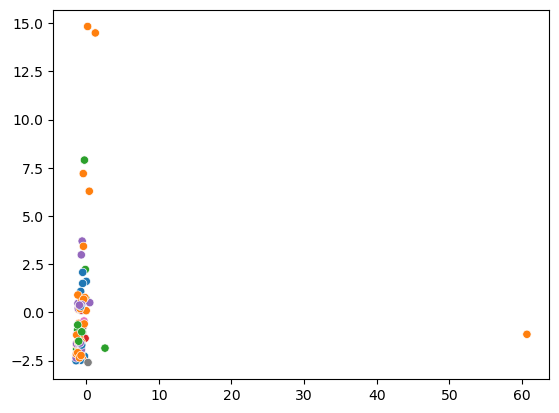

In [251]:
   
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_1_num)
sns.scatterplot(pca_result[:, 0], pca_result[:, 1], hue=df_1['genre'], legend=False)
plt.show()

C:\Users\edoar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


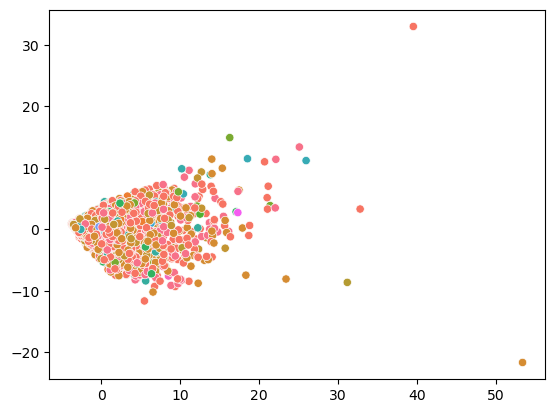

In [252]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_2_num)
sns.scatterplot(pca_result[:, 0], pca_result[:, 1], hue=df_2['genre'], legend=False)
plt.show()


C:\Users\edoar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


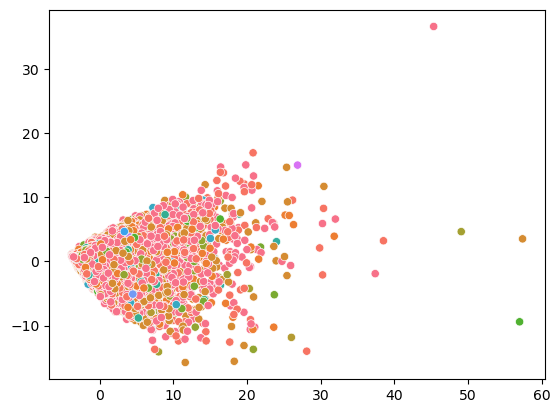

In [253]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_3_num)
sns.scatterplot(pca_result[:, 0], pca_result[:, 1], hue=df_3['genre'], legend=False)
plt.show()

## 3D PCA

In [57]:
def PCA3D (df_num, df):
    pca3 = PCA(n_components=3)
    pca3_result = pca3.fit_transform(df_num)

    fig = px.scatter_3d(
        pca3_result, x=0, y=1, z=2,
        color=df['genre'], labels= df['genre']
    )
    fig.update_traces(marker_size=8)
    fig.show()

In [58]:
PCA3D(df_1_num, df_1)

In [59]:
PCA3D(df_2_num, df_2)

In [60]:
PCA3D(df_3_num, df_3)

## Elbow Method

In [117]:
def Elbow(df):
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(df)
    inertias = []
    ks = [2,3,4,5,6,7,8,9]
    for i in ks:
        km = KMeans(n_clusters=i)
        #km = KMeans(n_clusters=5)
        km.fit(pca_result)
        clusters = km.fit_predict(pca_result)
        inertias.append(km.inertia_)
    plt.plot(ks, inertias)

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\edoar\AppData\Roaming\Python\Python

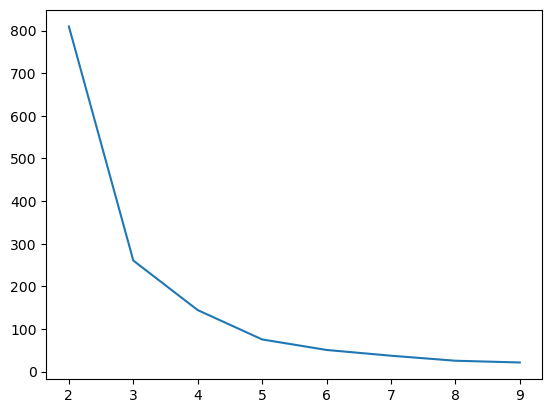

In [118]:
Elbow(df_1_num)

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\edoar\AppData\Roaming\Python\Python

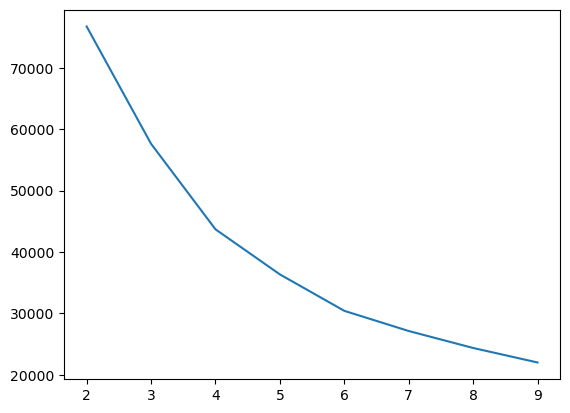

In [119]:
Elbow(df_2_num)

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\edoar\AppData\Roaming\Python\Python

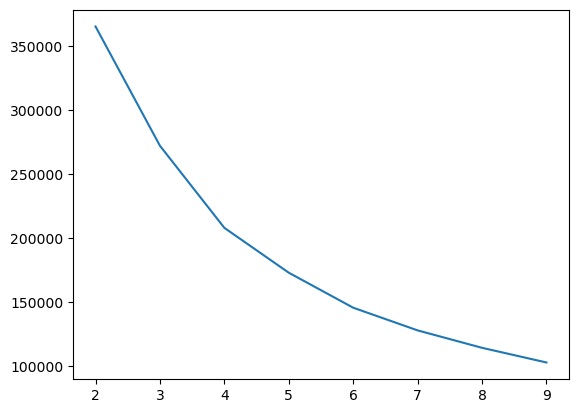

In [120]:
Elbow(df_3_num)

# T-SNE

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


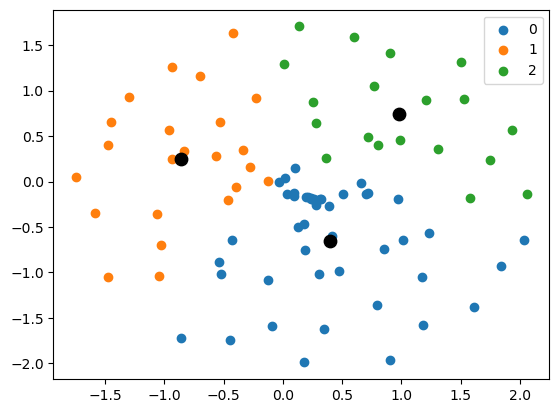

In [261]:
tsne = TSNE(2)
tsne_result = tsne.fit_transform(df_1_num)

tsne_df = pd.DataFrame(tsne_result)

km = KMeans(n_clusters=3)
km.fit(tsne_result)
tclusters = km.fit_predict(tsne_result)

tsne_df['cluster'] = tclusters

#Getting the Centroids
centroids = km.cluster_centers_
u_labels = np.unique(tclusters)

#plotting the results:
 
for i in u_labels:
    plt.scatter(tsne_df.iloc[tclusters == i , 0] , tsne_df.iloc[tclusters == i , 1] , label = i)
plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')
plt.legend()
plt.show()

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


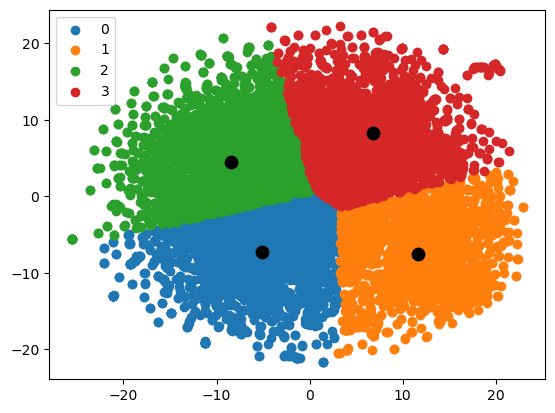

In [259]:
tsne = TSNE(2)
tsne_result = tsne.fit_transform(df_2_num)

tsne_df = pd.DataFrame(tsne_result)

km = KMeans(n_clusters=4)
km.fit(tsne_result)
tclusters = km.fit_predict(tsne_result)

tsne_df['cluster'] = tclusters

#Getting the Centroids
centroids = km.cluster_centers_
u_labels = np.unique(tclusters)

#plotting the results:
 
for i in u_labels:
    plt.scatter(tsne_df.iloc[tclusters == i , 0] , tsne_df.iloc[tclusters == i , 1] , label = i)
plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')
plt.legend()
plt.show()

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


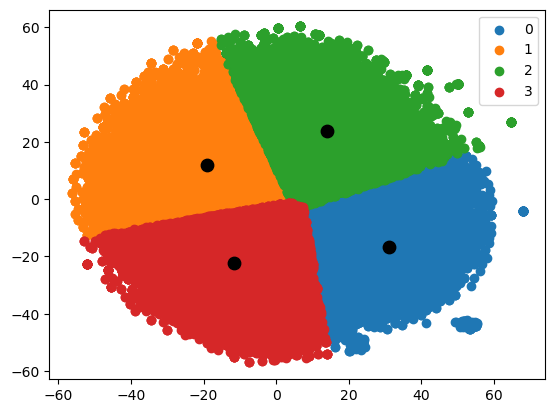

In [260]:
tsne = TSNE(2)
tsne_result = tsne.fit_transform(df_3_num)

tsne_df = pd.DataFrame(tsne_result)

km = KMeans(n_clusters=4)
km.fit(tsne_result)
tclusters = km.fit_predict(tsne_result)

tsne_df['cluster'] = tclusters

#Getting the Centroids
centroids = km.cluster_centers_
u_labels = np.unique(tclusters)

#plotting the results:
 
for i in u_labels:
    plt.scatter(tsne_df.iloc[tclusters == i , 0] , tsne_df.iloc[tclusters == i , 1] , label = i)
plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')
plt.legend()
plt.show()

C:\Users\edoar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


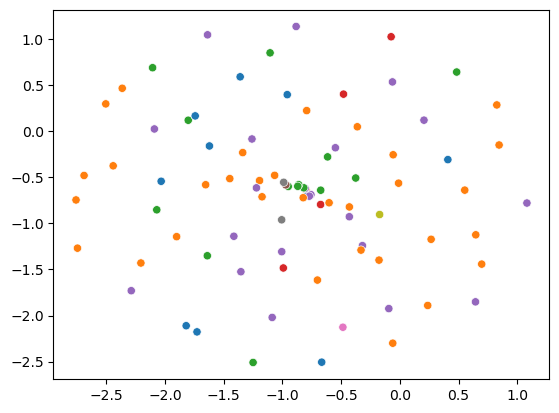

In [256]:
# def T_SNE(df_num, df):
tsne = TSNE(2)
tsne_result1 = tsne.fit_transform(df_1_num)
sns.scatterplot(tsne_result1[:, 0], tsne_result1[:, 1], hue=df_1['genre'], legend=False)
plt.show()



C:\Users\edoar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


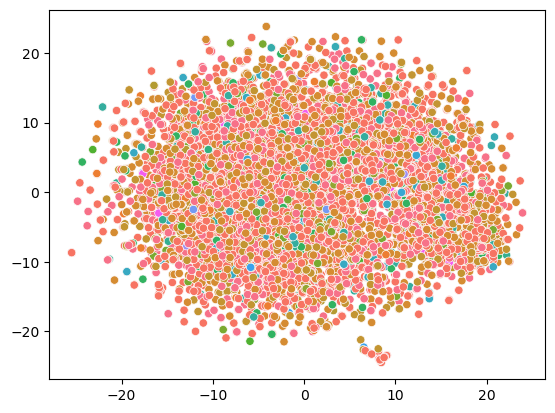

In [60]:
tsne = TSNE(2)
tsne_result2 = tsne.fit_transform(df_2_num)
sns.scatterplot(tsne_result2[:, 0], tsne_result2[:, 1], hue=df_2['genre'], legend=False)
plt.show()

C:\Users\edoar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


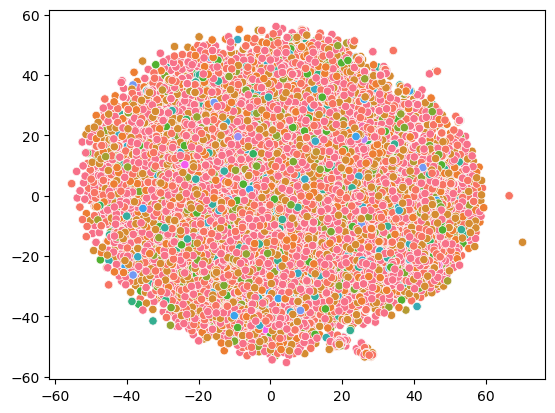

In [101]:
tsne = TSNE(2)
tsne_result3 = tsne.fit_transform(df_3_num)
sns.scatterplot(tsne_result3[:, 0], tsne_result3[:, 1], hue=df_3['genre'], legend=False)
plt.show()

# UMAP

In [21]:
reducer = UMAP()
umap_result = reducer.fit_transform(df_array)

In [44]:
km = KMeans(n_clusters=3)
km.fit(umap_result)
uclusters = km.fit_predict(umap_result)

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [45]:
umap_df = pd.DataFrame(umap_result)

In [46]:
umap_df.shape

(57702, 2)

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


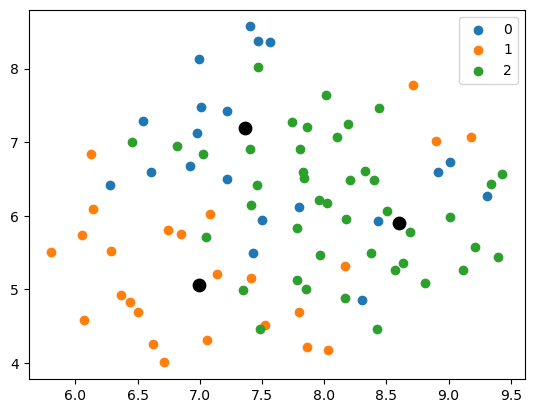

In [149]:
reducer = UMAP()
umap_result = reducer.fit_transform(df_1_num)

km = KMeans(n_clusters=3)
km.fit(umap_result)
uclusters = km.fit_predict(umap_result)

umap_df = pd.DataFrame(umap_result)

#Getting the Centroids
centroids = km.cluster_centers_
u_labels = np.unique(uclusters)
tclusters = km.fit_predict(tsne_result1)

#plotting the results:
 
for i in u_labels:
    plt.scatter(umap_df.iloc[tclusters == i , 0] , umap_df.iloc[tclusters == i , 1] , label = i)
plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')
plt.legend()
plt.show()

In [150]:
df_1_clusters = df_1
df_1_clusters['cluster'] =uclusters

In [151]:
df_1_clusters

,0,1,2,3,4,5,6,7,8,9,...,9992,9993,9994,9995,9996,9997,9998,9999,genre,cluster
0,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,Indie,2
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Action,0
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Adventure,1
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,Indie,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Adventure,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Casual,0
84,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Indie,1
85,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Adventure,0
86,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Strategy,0


In [175]:
ok = df_1_clusters.query("cluster == 0").groupby(['cluster', 'genre']).size()

In [176]:
ok

cluster  genre     
0        Action        12
         Adventure      5
         Casual         7
         FreetoPlay     2
         Indie          2
         RPG            1
         Strategy       1
dtype: int64

C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


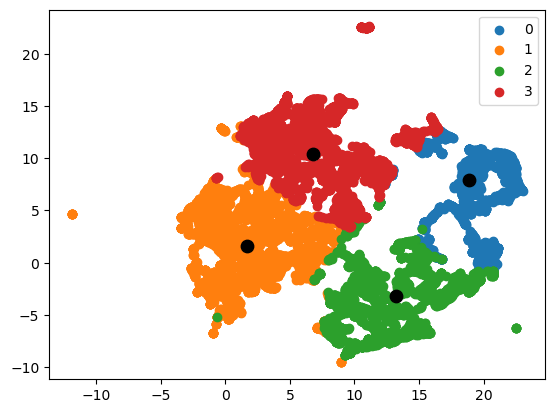

In [266]:
reducer = UMAP()
umap_result = reducer.fit_transform(tsne_result2)

km = KMeans(n_clusters=4)
km.fit(umap_result)
uclusters = km.fit_predict(umap_result)

umap_df = pd.DataFrame(umap_result)

#Getting the Centroids
centroids = km.cluster_centers_
u_labels = np.unique(uclusters)
tclusters = km.fit_predict(tsne_result2)

#plotting the results:
 
for i in u_labels:
    plt.scatter(umap_df.iloc[tclusters == i , 0] , umap_df.iloc[tclusters == i , 1] , label = i)
plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')
plt.legend()
plt.show()

In [362]:
df_2_clusters = df_2
df_2_clusters['cluster'] =uclusters

In [363]:
df_2_clusters

,0,1,2,3,4,5,6,7,8,9,...,9992,9993,9994,9995,9996,9997,9998,9999,genre,cluster
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Casual,2
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Action,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Strategy,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Action,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Adventure,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9686,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Adventure,2
9687,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Casual,1
9688,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Indie,1
9689,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Casual,3


In [364]:
df_2_clusters.groupby(['cluster']).count()[0]

cluster
0    2399
1    2691
2    1691
3    2910
Name: 0, dtype: int64

In [365]:
df_groups2 = df_2_clusters[['genre', 'cluster']].copy()


In [366]:
cluster_df2 = df_groups2.query("cluster == 2")
cluster_df2 = cluster_df2.groupby(['genre']).count()
cluster_df2= cluster_df2.sort_values('cluster', ascending= False)
cluster_df2 = cluster_df2.rename(columns = {'cluster': 'games_group2'})
cluster_df2

,games_group2
genre,
Action,702
Adventure,343
Casual,295
Indie,142
Simulation,34
RPG,28
FreetoPlay,28
Strategy,23
Racing,12


In [367]:
df_2_clusters.shape

(9691, 10002)

In [368]:
df_3_clusters.shape

(46928, 10002)

In [369]:
df_3_clusters.groupby(['cluster']).count()[0]

cluster
0    11510
1    11847
2    10997
3    12574
Name: 0, dtype: int64

In [372]:
df_groups3 = df_3_clusters[['genre', 'cluster']].copy()

cluster_df3 = df_groups3.query("cluster == 2")
cluster_df3 = cluster_df3.groupby(['genre']).count()
cluster_df3= cluster_df3.sort_values('cluster', ascending= False)
cluster_df3 = cluster_df3.rename(columns = {'cluster': 'games_group3'})
cluster_df3

,games_group3
genre,
Action,4404
Adventure,2164
Casual,2025
Indie,973
Simulation,219
FreetoPlay,172
Strategy,165
RPG,152
Violent,88


In [373]:
df_clusters_comp = cluster_df2.merge(cluster_df3, how= 'inner', right_on = 'genre', left_on = 'genre')
df_clusters_comp['difference'] = df_clusters_comp['games_group3']/df_clusters_comp['games_group2']
df_clusters_comp= df_clusters_comp.sort_values('difference', ascending= False)
df_clusters_comp.reset_index()

,genre,games_group2,games_group3,difference
0,Utilities,3,52,17.333333
1,Design&Illustration,2,26,13.000000
2,Sports,2,25,12.500000
3,Animation&Modeling,6,53,8.833333
4,AudioProduction,3,25,8.333333
5,Violent,11,88,8.000000
6,Strategy,23,165,7.173913
7,Casual,295,2025,6.864407
8,Indie,142,973,6.852113
9,Simulation,34,219,6.441176


In [379]:
# df_groups2 = df_2_clusters[['genre', 'cluster']].copy()

# cluster_df2 = df_groups2.query("cluster == 0")
# cluster_df2 = cluster_df2.groupby(['genre']).count()
# cluster_df2= cluster_df2.sort_values('cluster', ascending= False)
# cluster_df2 = cluster_df2.rename(columns = {'cluster': 'games_group2'})
# cluster_df2

# df_groups3 = df_3_clusters[['genre', 'cluster']].copy()
# cluster_df3 = df_groups3.query("cluster == 2")
# cluster_df3 = cluster_df3.groupby(['genre']).count()
# cluster_df3= cluster_df3.sort_values('cluster', ascending= False)
# cluster_df3 = cluster_df3.rename(columns = {'cluster': 'games_group3'})
# cluster_df3

# df_clusters_comp = cluster_df2.merge(cluster_df3, how= 'inner', right_on = 'genre', left_on = 'genre')
# df_clusters_comp['difference'] = df_clusters_comp['games_group3']/df_clusters_comp['games_group2']
# df_clusters_comp= df_clusters_comp.sort_values('difference', ascending= False)
# df_clusters_comp.reset_index()

,genre,games_group2,games_group3,difference
0,MassivelyMultiplayer,1,9,9.000000
1,FreetoPlay,33,172,5.212121
2,Simulation,43,219,5.093023
3,SexualContent,4,20,5.000000
4,Adventure,441,2164,4.907029
5,Violent,18,88,4.888889
6,Utilities,11,52,4.727273
7,Action,968,4404,4.549587
8,Casual,446,2025,4.540359
9,Indie,220,973,4.422727


C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\edoar\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


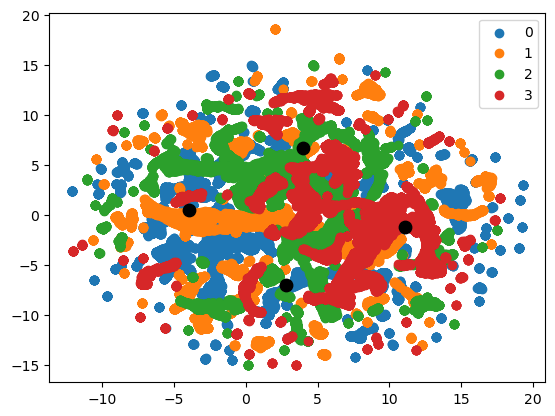

In [104]:
reducer = UMAP()
umap_result = reducer.fit_transform(tsne_result3)

km = KMeans(n_clusters=4)
km.fit(umap_result)
uclusters = km.fit_predict(umap_result)

umap_df = pd.DataFrame(umap_result)

#Getting the Centroids
centroids = km.cluster_centers_
u_labels = np.unique(uclusters)
tclusters = km.fit_predict(tsne_result3)

#plotting the results:
 
for i in u_labels:
    plt.scatter(umap_df.iloc[tclusters == i , 0] , umap_df.iloc[tclusters == i , 1] , label = i)
plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')
plt.legend()
plt.show()

In [134]:
df_3_clusters = df_3
df_3_clusters['cluster'] =uclusters

In [135]:
df_3_clusters

,0,1,2,3,4,5,6,7,8,9,...,9992,9993,9994,9995,9996,9997,9998,9999,genre,cluster
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Action,2
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Action,1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Adventure,2
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Adventure,3
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Adventure,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46923,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Simulation,1
46924,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Adventure,3
46925,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Action,3
46926,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Casual,1
